In [1]:
import intake
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from calendar import monthrange
import numpy as np
import cartopy
from tqdm import tqdm
from scipy import interpolate
import pandas as pd
import seaborn as sns
import os
from scipy import stats

#%config InlineBackend.figure_format='retina'

from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

dataframe (Dataframe) - contains CMIP6 intake json 

In [2]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [3]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/'

In [4]:
# necessary url
url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
# open the catalog
dataframe = intake.open_esm_datastore(url)

### Empirical data

In [5]:
#os.chdir('/home/jovyan/PlanetaryComputerExamples/Paper3')
Sr = xr.open_dataset(parent_dir+'Empirical_data/Data_Rootzone-storage-capacity.nc').mle_gumbel[0]

# Interpolated data
new_lon = Sr.lon.values
new_lat = Sr.lat.values

In [6]:
Landuse_all = xr.open_dataset(parent_dir+'Empirical_data/Landuse_resampled_0.25_lonlatbox.nc').sel(lat = slice(-50,50)).Band1

#Landuse with both forest and savanna
Landuse_with_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))
## Landuse with only forest
Landuse = Landuse_all.where((Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100))
## landuse with only savanna
Landuse_only_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))

#### Defining functions

In [7]:
def get_iqr_values(df_in, col_name):
    median = df_in[col_name].median()
    q1 = df_in[col_name].quantile(0.25) # 25th percentile / 1st quartile
    q3 = df_in[col_name].quantile(0.75) # 7th percentile / 3rd quartile
    iqr = q3-q1 #Interquartile range
    minimum  = q1-1.5*iqr # The minimum value or the |- marker in the box plot
    maximum = q3+1.5*iqr # The maximum value or the -| marker in the box plot
    return median, q1, q3, iqr, minimum, maximum

def get_iqr_text(df_in, col_name):
    median, q1, q3, iqr, minimum, maximum = get_iqr_values(df_in, col_name)
    text = f"median={median:.2f}, q1={q1:.2f}, q3={q3:.2f}, iqr={iqr:.2f}, minimum={minimum:.2f}, maximum={maximum:.2f}"
    return text

def remove_outliers(df_in, col_name):
    _, _, _, _, minimum, maximum = get_iqr_values(df_in, col_name)
    df_out = df_in.loc[(df_in[col_name] > minimum) & (df_in[col_name] < maximum)]
    return df_out

In [8]:
#Funtion to calulate days per month as a constant funtion (needs to be multiplied to CMIP6-precipitation estimates)
def sum_of_day(year_start, year_end, lat_1, lon_2):
    sum_of_day = []
    year = 0
    for year in range(year_start,year_end+1):
        for month in range(1,13):
            sum_of_day.append(monthrange(year, month)[1]*(np.ones((lat_1, lon_2)))*86400)
    sum_of_day = (np.array(sum_of_day))
    return sum_of_day

In [9]:
def calc_Seasonality(data):
    # Input is monthly data of precipitation
    Seasonality = []
    for lat in range(data.shape[1]):
        for lon in range(data.shape[2]):
            Seasonality.append(((1/data[:,lat,lon].sum())*(np.array([abs((data[i,lat,lon]-(data[:,lat,lon].sum()/12))) for i in range(12)]).sum())))
    Seasonality = (np.array(Seasonality).reshape(data.shape[1],data.shape[2]))
    return Seasonality

In [10]:
def interp_selfilter(file, Landuse,lat_min,lat_max,lon_min,lon_max):
    if isinstance(file,(np.ndarray)):
        file = xr.DataArray(file, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit"))
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    else:
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    return file

In [11]:
def boxplot_custom(order, data, ax=None, **kwargs):
    ax = ax or plt.gca()
    data = remove_outliers(data, data.columns[0])
    ax.plot([data.quantile(0.25)[0], data.quantile(0.75)[0]], [order, order], **kwargs, lw = 2.5, color = 'black', zorder=1)
    ax.plot([data.quantile(0.025)[0], data.quantile(0.975)[0]], [order, order], **kwargs, lw = 1, color = 'black', zorder=0)
    #ax.plot([(data.quantile(0.25)[0]-1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0])), 
    #        (data.quantile(0.75)[0]+1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0]))], [0,0], **kwargs, lw = 1, color = 'black', zorder=0) 
    ax.scatter(data.median(), order, **kwargs, s = 150, edgecolors = 'black', lw = 2.5, facecolor = '#8c6bb1', zorder=2);
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.get_yaxis().set_ticks([])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.tight_layout()
    return data.quantile(0.025)[0], data.quantile(0.25)[0], data.quantile(0.75)[0], data.quantile(0.975)[0];

In [12]:
def forest_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_sel = Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
            #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
            pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                       pd.DataFrame({'Landuse': Landuse_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                       pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()

    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    """
    df_full = pd.DataFrame({'Precip_yearly': (dataframe.filter(like='Precip').dropna()).sum(axis = 1), 
              'Seasonality': seasonality})
    """
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    sz = dataframe['Precip'].size-1
    dataframe['Precip_percentile'] = dataframe['Precip'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    dataframe['Seasonality_percentile'] = dataframe['Seasonality'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)
    dataframe = dataframe[['Sr','Precip','Seasonality','Precip_percentile','Seasonality_percentile']]
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [13]:
def savanna_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_only_savanna_sel = Landuse_only_savanna.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
        #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
        pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                   pd.DataFrame({'Landuse': Landuse_only_savanna_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                   pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()
    
    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    dataframe = dataframe[['Sr','Precip','Seasonality']]
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [14]:
def combined_classification_all_WSf_future(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        if 'LWSf' == Forest_class:
            C = B.where((B == 1) | (B == 4) | (B == 7))
        if 'MWSf' == Forest_class:
            C = B.where((B == 2) | (B == 5) | (B == 8))
        if 'HWSf' == Forest_class:
            C = B.where((B == 3) | (B == 6) | (B == 9))
        if 'Tipping' == Forest_class:
            C = B.where((B == 11) | (B == 12) | (B == 13))
        #else:
        #    print('Check', Forest_class)
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [15]:
def barchart_area_classes(CMIP6_class_all_forest_savanna_corrected, SSP, forest_class, Sr_lower_threshold, 
                          Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values <= Sr_lower_threshold).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where((Sr_sel.values > Sr_lower_threshold) & (Sr_sel.values <= Sr_upper_threshold)).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where(Sr_sel.values > Sr_upper_threshold).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']
    
    a,b,c = area
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="\\\\", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [16]:
def barchart_area_classes_custom(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3,lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1)
    
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [17]:
def Forest_savanna_transition(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_975_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_975_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    return CMIP6_class_array_corrected

In [18]:
def Forest_savanna_transition_low_sensitivity(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    #print(file_name.iloc[i,1],':',np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
    return CMIP6_class_array_corrected

In [19]:
def Forest_savanna_transition_high_sensitivity(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= sav_Prec_75_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_25_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_75_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= sav_Prec_75_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_25_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > sav_Prec_75_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_75_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    #print(file_name.iloc[i,1],':',np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
    return CMIP6_class_array_corrected

#### Running analysis

In [20]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
if (lon_min == 270) & (lon_max == 330):
    Country = 'South America'
else:
    Country = 'Check country'
Sr_lower_threshold = 100
Sr_upper_threshold = 400

South America (Total Area) = 8216635.38904723 km^2

In [21]:
df_final = pd.read_csv(parent_dir+'CMIP6-Future_models_all_(with Sr-eq)_South America.csv')

In [22]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-400eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,116.575532,409.900705
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,95.728133,314.000824
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,127.053403,446.708181
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,93.549910,348.750239
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,120.418121,336.189765
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,164.953056,445.445854
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,155.168020,288.220768
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,147.600075,282.739693
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,194.054560,337.462342
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,165.402306,338.410103


------------

----

In [23]:
save_folder = 'SA_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [24]:
keys = ['ssp126.ACCESS-CM2', 'ssp126.ACCESS-ESM1-5', 'ssp126.AWI-CM-1-1-MR', 'ssp126.BCC-CSM2-MR', 'ssp126.CAS-ESM2-0', 'ssp126.CESM2-WACCM', 'ssp126.CMCC-CM2-SR5', 'ssp126.CMCC-ESM2', 'ssp126.CanESM5', 'ssp126.EC-Earth3', 'ssp126.EC-Earth3-Veg-LR', 'ssp126.FGOALS-f3-L', 'ssp126.FGOALS-g3', 'ssp126.FIO-ESM-2-0', 'ssp126.GFDL-ESM4', 'ssp126.INM-CM4-8', 'ssp126.INM-CM5-0', 'ssp126.IPSL-CM6A-LR', 'ssp126.KACE-1-0-G', 'ssp126.MIROC6', 'ssp126.MPI-ESM1-2-HR', 'ssp126.MPI-ESM1-2-LR', 'ssp126.MRI-ESM2-0', 'ssp126.NESM3', 'ssp126.NorESM2-LM', 'ssp126.NorESM2-MM', 'ssp126.TaiESM1', 'ssp245.ACCESS-CM2', 'ssp245.AWI-CM-1-1-MR', 'ssp245.BCC-CSM2-MR', 'ssp245.CAS-ESM2-0', 'ssp245.CESM2-WACCM', 'ssp245.CMCC-CM2-SR5', 'ssp245.CMCC-ESM2', 'ssp245.CanESM5', 'ssp245.EC-Earth3', 'ssp245.EC-Earth3-CC', 'ssp245.EC-Earth3-Veg-LR', 'ssp245.FGOALS-f3-L', 'ssp245.FGOALS-g3', 'ssp245.FIO-ESM-2-0', 'ssp245.GFDL-CM4', 'ssp245.GFDL-ESM4', 'ssp245.IITM-ESM', 'ssp245.INM-CM4-8', 'ssp245.INM-CM5-0', 'ssp245.IPSL-CM6A-LR', 'ssp245.KACE-1-0-G', 'ssp245.MIROC6', 'ssp245.MPI-ESM1-2-HR', 'ssp245.MPI-ESM1-2-LR', 'ssp245.MRI-ESM2-0', 'ssp245.NESM3', 'ssp245.NorESM2-LM', 'ssp245.NorESM2-MM', 'ssp245.TaiESM1', 'ssp370.ACCESS-CM2', 'ssp370.AWI-CM-1-1-MR', 'ssp370.BCC-CSM2-MR', 'ssp370.CAS-ESM2-0', 'ssp370.CESM2-WACCM', 'ssp370.CMCC-CM2-SR5', 'ssp370.CMCC-ESM2', 'ssp370.CanESM5', 'ssp370.EC-Earth3', 'ssp370.EC-Earth3-AerChem', 'ssp370.EC-Earth3-Veg-LR', 'ssp370.FGOALS-f3-L', 'ssp370.FGOALS-g3', 'ssp370.GFDL-ESM4', 'ssp370.IITM-ESM', 'ssp370.INM-CM4-8', 'ssp370.INM-CM5-0', 'ssp370.IPSL-CM5A2-INCA', 'ssp370.IPSL-CM6A-LR', 'ssp370.KACE-1-0-G', 'ssp370.MIROC6', 'ssp370.MPI-ESM1-2-HR', 'ssp370.MPI-ESM1-2-LR', 'ssp370.MRI-ESM2-0', 'ssp370.NorESM2-LM', 'ssp370.NorESM2-MM', 'ssp370.TaiESM1', 'ssp585.ACCESS-CM2', 'ssp585.ACCESS-ESM1-5', 'ssp585.AWI-CM-1-1-MR', 'ssp585.BCC-CSM2-MR', 'ssp585.CAS-ESM2-0', 'ssp585.CESM2-WACCM', 'ssp585.CMCC-CM2-SR5', 'ssp585.CMCC-ESM2', 'ssp585.CanESM5', 'ssp585.E3SM-1-1', 'ssp585.EC-Earth3', 'ssp585.EC-Earth3-CC', 'ssp585.EC-Earth3-Veg-LR', 'ssp585.FGOALS-f3-L', 'ssp585.FGOALS-g3', 'ssp585.FIO-ESM-2-0', 'ssp585.GFDL-CM4', 'ssp585.GFDL-ESM4', 'ssp585.IITM-ESM', 'ssp585.INM-CM4-8', 'ssp585.INM-CM5-0', 'ssp585.IPSL-CM6A-LR', 'ssp585.KACE-1-0-G', 'ssp585.MIROC6', 'ssp585.MPI-ESM1-2-HR', 'ssp585.MPI-ESM1-2-LR', 'ssp585.MRI-ESM2-0', 'ssp585.NESM3', 'ssp585.NorESM2-MM', 'ssp585.TaiESM1']

In [25]:
SA_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:02<00:00, 54.86it/s]


In [26]:
SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Low.nc').Variable

100%|██████████| 113/113 [00:01<00:00, 67.08it/s]


In [27]:
SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-High.nc').Variable

100%|██████████| 113/113 [00:01<00:00, 74.75it/s]


#### Running analysis

In [28]:
# For Africa
AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max = [-35,15,0,55]
if (AF_lon_min == 0) & (AF_lon_max == 55):
    Country = 'Africa'
else:
    Country = 'Check country'
AF_Sr_lower_threshold = 100
AF_Sr_upper_threshold = 350

Africa (Total Area) = 5611461.72376163 km^2

In [29]:
df_final = pd.read_csv(parent_dir+'/CMIP6-Future_models_all_(with Sr-eq)_Africa.csv')

In [30]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-350eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,121.113881,310.662721
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,206.084287,295.555795
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,121.608941,354.318473
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,67.826050,134.381436
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,49.693557,220.267113
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,129.916378,316.431578
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,110.769568,204.207156
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,122.625083,203.495422
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,258.612941,422.435308
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,110.789278,217.853644


---

---

In [31]:
save_folder = 'AF_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [32]:
AF_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:01<00:00, 58.70it/s]


In [33]:
AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Low.nc').Variable

100%|██████████| 113/113 [00:01<00:00, 61.85it/s]


In [34]:
AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-High.nc').Variable

100%|██████████| 113/113 [00:01<00:00, 63.07it/s]


## --------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [35]:
def barchart_area_classes_combined_plotting(CMIP6_class_all_forest_savanna_corrected, SSP, forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, axis_l = 1, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values <= Sr_lower_threshold).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where((Sr_sel.values > Sr_lower_threshold) & (Sr_sel.values <= Sr_upper_threshold)).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where(Sr_sel.values > Sr_upper_threshold).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    a,b,c = area
    color = ['#c2a5cf','#ffafbd','#e1e1e1']
    
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="....", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 0.5, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 0.5, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 0.5, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=9)
    ax.get_xaxis().set_ticks([])
    
    if axis_l == 1:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_label_position("right")
        ax.set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 10)
    if axis_l == 0:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [36]:
def barchart_area_classes_custom_combined_plotting(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3, lat_min, lat_max, lon_min, lon_max, axis_l = 1, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#c2a5cf','#ffafbd','#e1e1e1']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 0.5, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 0.5, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 0.5, **kwargs)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.get_xaxis().set_ticks([])
    
    if axis_l == 1:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_label_position("right")
        ax.set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 8)
    if axis_l == 0:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [37]:
def rectangle_combined_plots():
    global zorder
    for x_axis, color in zip([0.706,0.505,0.302,0.100], ['#FFFFFF','#FFFFFF','#FFFFFF','#FFFFFF']):
        """
        rect = plt.Rectangle(
            # (lower-left corner), width, height
            (0.098, x_axis), 0.805, 0.195, fill=False, lw=1.2, 
            transform=fig.transFigure, figure=fig, alpha = 0.6, edgecolor = color, zorder = -10)
        fig.patches.extend([rect])
        """
        rect = plt.Rectangle(
            # (lower-left corner), width, height
            (0.084, x_axis), 0.014, 0.195, lw=1.2, facecolor = color,
            transform=fig.transFigure, figure=fig, alpha = 0.55, edgecolor = color, zorder = -10)
        fig.patches.extend([rect])

In [38]:
def combined_classification_all_WSf_future_custom(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [39]:
def combined_classification_all_WSf_future_custom_1(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [40]:
def combined_classification_all_WSf_future_custom_2(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [41]:
def calc_area_individually(array, lat_min, lat_max, lon_min, lon_max):
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    #Area.plot()
    #plt.show()
    #plt.imshow(array)
    #plt.show()
    Area_sum = Area.where(array>0).sum().values
    Area_sum = Area_sum/1000000 ## km2 x 10^6
    return Area_sum 

In [42]:
Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
Sr_contour = (Sr_sel/Sr_sel).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

In [43]:
Sr_sel = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)
Sr_contour_AF = (Sr_sel/Sr_sel).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


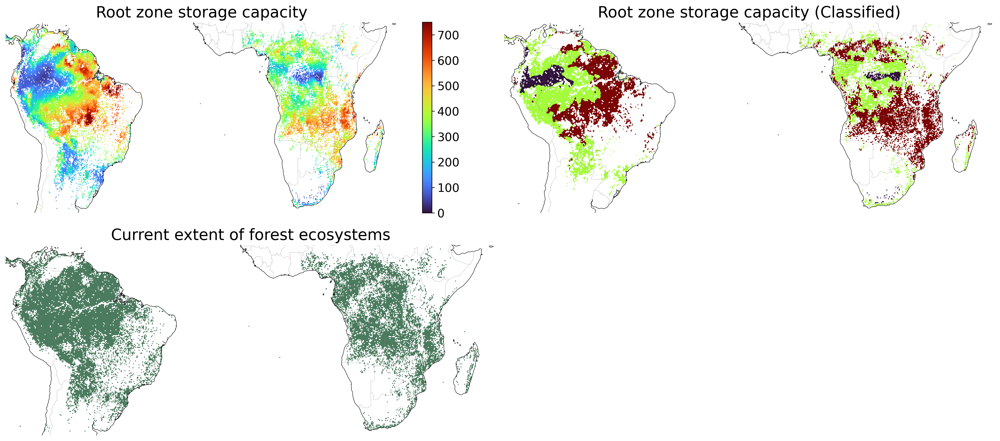

In [44]:
fig = plt.figure(figsize=(18,8), dpi = 300)
ax = [plt.subplot(221,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(222,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(223,projection=ccrs.PlateCarree(), aspect='auto')]

Sr.where(Landuse.values>0).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).plot(ax = ax[0], vmin = 0, vmax = 750, add_colorbar=False, cmap = 'turbo')
Sr.where(Landuse.values>0).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).plot.contourf(ax = ax[1], vmin = 0, vmax = 750, add_colorbar=False, 
                                                                                                         levels = [0,100,400], cmap = 'turbo')
Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).plot(alpha = 0.7, ax = ax[2], vmin = 0, vmax = 0, add_colorbar=False, cmap = 'Greens')

im = Sr.where(Landuse.values>0).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).plot(ax = ax[0], vmin = 0, vmax = 750,
                                                                                                                 cmap = 'turbo', add_colorbar=False)
cbar = plt.colorbar(im, label=' ', ax = ax[0])
cbar.ax.tick_params(labelsize=15)

Sr.where(Landuse.values>0).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).plot(ax = ax[1], vmin = 0, vmax = 750, add_colorbar=False, 
                                                                                                            levels = [0,100,350], cmap = 'turbo')
Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).plot(alpha = 0.7, ax = ax[2], vmin = 0, vmax = 0, add_colorbar=False, cmap = 'Greens')

for j in range(3):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

ax[0].set_title('Root zone storage capacity', fontsize = '20', color = 'black');
ax[1].set_title('Root zone storage capacity (Classified)', fontsize = '20', color = 'black');
ax[2].set_title('Current extent of forest ecosystems', fontsize = '20', color = 'black');
plt.tight_layout()
fig.savefig(parent_dir+'/Figures/Supplementary_Fig1_Classification.tif', dpi=300, bbox_inches="tight")

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


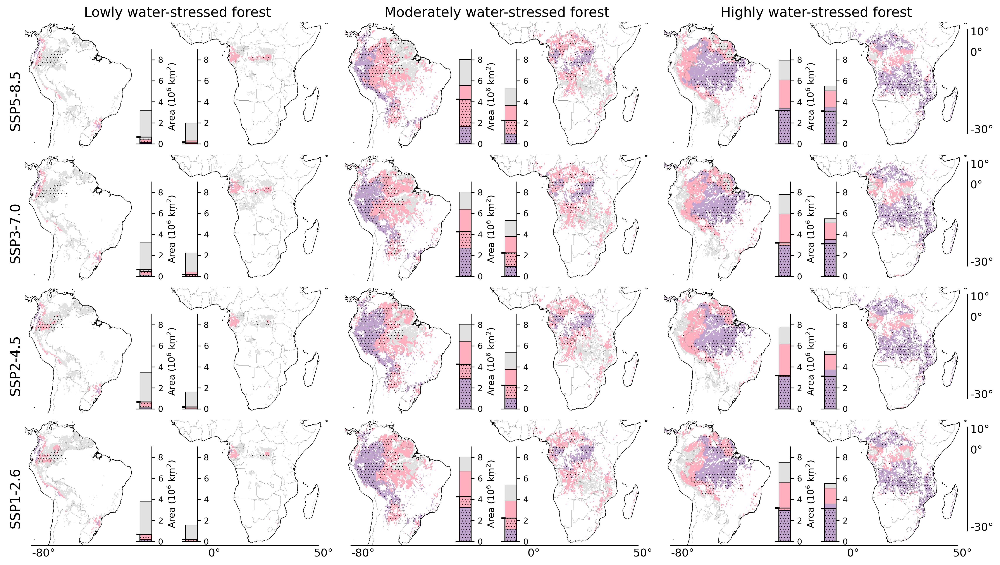

In [58]:
# 4x3 (without forest savanna transition)
plt.rcParams['hatch.linewidth'] = 0.5

fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

for i in [0,3,6,9]:
    ax[i+0].contourf(Sr_contour.where(Sr <=Sr_lower_threshold).lon.values, Sr_contour.where(Sr <=Sr_lower_threshold).lat.values, (Sr_contour.where(Sr <=Sr_lower_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).lon.values, Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).lat.values, Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).values, lw = 0.05, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(Sr_contour.where(Sr >Sr_upper_threshold).lon.values, Sr_contour.where(Sr > Sr_upper_threshold).lat.values, (Sr_contour.where(Sr > Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['....'], lw = 0.05, transform=cartopy.crs.PlateCarree(), zorder = 10)

rectangle_combined_plots()
colors = ['#e1e1e1','#ffafbd','#c2a5cf']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -28, SSP_name, ha='center', fontsize = 15, color = 'black', zorder = 1000, rotation  = 90);
    for Forest_class,j in zip(['LWSf','MWSf','HWSf'],[0,1,2]):
        combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,Forest_class).plot.contourf(ax = ax[i+j], vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], 
                                                                                            add_colorbar=False, colors = colors)
        axs = inset_axes(ax[i+j], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+j].transAxes)
        barchart_area_classes_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,Forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, ax = axs)
    i = i+j+1 

for i in [0,3,6,9]:
    ax[i+0].contourf(Sr_contour_AF.where(Sr <= AF_Sr_lower_threshold).lon.values, Sr_contour_AF.where(Sr <= AF_Sr_lower_threshold).lat.values, (Sr_contour_AF.where(Sr <= AF_Sr_lower_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+1].contourf(Sr_contour_AF.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).lon.values, Sr_contour_AF.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).lat.values, Sr_contour_AF.where((Sr> AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)
    ax[i+2].contourf(Sr_contour_AF.where(Sr > AF_Sr_upper_threshold).lon.values, Sr_contour_AF.where(Sr > AF_Sr_upper_threshold).lat.values, (Sr_contour_AF.where(Sr > AF_Sr_upper_threshold)).values, levels=[0,1], colors='none', hatches=['....'], transform=cartopy.crs.PlateCarree(), zorder = 10)

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    for Forest_class,j in zip(['LWSf','MWSf','HWSf'],[0,1,2]):
        combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,Forest_class).plot.contourf(ax = ax[i+j], vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], 
                                                                                            add_colorbar=False, colors = colors)
        axs = inset_axes(ax[i+j], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+j].transAxes)
        barchart_area_classes_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,Forest_class, AF_Sr_lower_threshold, AF_Sr_upper_threshold, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, axis_l = 0, ax = axs)
    i = i+j+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

ax[0].set_title('Lowly water-stressed forest', fontsize = '15', color = 'black');
ax[1].set_title('Moderately water-stressed forest', fontsize = '15', color = 'black');
ax[2].set_title('Highly water-stressed forest', fontsize = '15', color = 'black');

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)
#fig.savefig(parent_dir+'/Figures/Fig2.svg', dpi=10, bbox_inches="tight")
fig.savefig(parent_dir+'/Figures/Supplementary_Fig5_Classification_forests.tif', dpi=500, bbox_inches="tight")

In [59]:
a = calc_area_individually(Sr_contour.where(Sr <=Sr_lower_threshold).values,lat_min, lat_max, lon_min, lon_max)
print('SA-empirical', a)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,'LWSf')
    b = b.where(b > 0.5).values
    #print('SA', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
    print(SSP, ((calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)-a)/a)*100,'%')
print('      ')
a = calc_area_individually(Sr_contour_AF.where(Sr <=AF_Sr_lower_threshold).values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
print('AF-empirical', a)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,'LWSf')
    b = b.where(b > 0.5).values
    #print(SSP,calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
    print(SSP, ((calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)-a)/a)*100, '%')

SA-empirical 0.6579320609447543
ssp585 -81.75838709425626 %
ssp370 -80.55610185472256 %
ssp245 -76.19753453357347 %
ssp126 -72.0785503445986 %
      
AF-empirical 0.1814977130132235
ssp585 -99.57427563726337 %
ssp370 -88.08058509843666 %
ssp245 -99.57422700094712 %
ssp126 -93.18867767889844 %


In [60]:
a = calc_area_individually(Sr_contour.where(Sr <=Sr_lower_threshold).values,lat_min, lat_max, lon_min, lon_max)

for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print(SSP)
    b = combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,'LWSf')
    b = b.where(b > 0.5).values
    print('SA-net', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,1)
    b = b.where(b > 0.5).values
    print('SA-remains', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_2(SSP,SA_CMIP6_class_all_forest_savanna_corrected,4,7)
    b = b.where(b > 0.5).values
    print('SA-increase', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')

print('----------------------------')
a = calc_area_individually(Sr_contour_AF.where(Sr <=AF_Sr_lower_threshold).values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print(SSP)
    b = combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,'LWSf')
    b = b.where(b > 0.5).values
    print('AF-net', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,1)
    b = b.where(b > 0.5).values
    print('AF-remains', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_2(SSP,AF_CMIP6_class_all_forest_savanna_corrected,4,7)
    b = b.where(b > 0.5).values
    print('AF-increase', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')

ssp585
SA-net 0.12001741974032402 - 18.241612905743732 %
SA-remains 0.04689361119274373 - 7.127424543714602 %
SA-increase 0.0731238085475803 - 11.114188362029132 %
ssp370
SA-net 0.1279276397952228 - 19.44389814527745 %
SA-remains 0.059252622701096616 - 9.00588772281641 %
SA-increase 0.06867501709412618 - 10.43801042246104 %
ssp245
SA-net 0.1566040515989234 - 23.80246546642652 %
SA-remains 0.06541302320976145 - 9.942215479791628 %
SA-increase 0.09119102838916196 - 13.86024998663489 %
ssp126
SA-net 0.1837041691634344 - 27.921449655401396 %
SA-remains 0.0824007648399495 - 12.524205724467436 %
SA-increase 0.10130340432348489 - 15.397243930933957 %
----------------------------
ssp585
AF-net 0.0007726799821071253 - 0.4257243627366421 %
AF-remains 0.0 - 0.0 %
AF-increase 0.0007726799821071253 - 0.4257243627366421 %
ssp370
AF-net 0.02163346545089485 - 11.919414901563352 %
AF-remains 0.0 - 0.0 %
AF-increase 0.02163346545089485 - 11.919414901563352 %
ssp245
AF-net 0.0007727682559087937 - 0.42577

In [61]:
a = calc_area_individually(Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).values,lat_min, lat_max, lon_min, lon_max)
print('SA-empirical', a)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,'MWSf')
    b = b.where(b > 0.5).values
    #print('SA', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
    print(SSP, ((calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)-a)/a)*100,'%')
print('      ')
a = calc_area_individually(Sr_contour_AF.where((Sr>AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
print('AF-empirical', a)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,'MWSf')
    b = b.where(b > 0.5).values
    #print(SSP,calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
    print(SSP, ((calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)-a)/a)*100, '%')

SA-empirical 4.2468824730300385
ssp585 -61.392945588859085 %
ssp370 -36.68954378716109 %
ssp245 -32.36484378324479 %
ssp126 -23.779231433340744 %
      
AF-empirical 2.2279166970566546
ssp585 -58.84090966510642 %
ssp370 -57.801962670063986 %
ssp245 -55.035011611053704 %
ssp126 -48.04474859228622 %


In [62]:
a = calc_area_individually(Sr_contour.where((Sr>Sr_lower_threshold) & (Sr <= Sr_upper_threshold)).values,lat_min, lat_max, lon_min, lon_max)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print(SSP)
    b = combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,'MWSf')
    b = b.where(b > 0.5).values
    print('SA-net', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,5)
    b = b.where(b > 0.5).values
    print('SA-remains', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_2(SSP,SA_CMIP6_class_all_forest_savanna_corrected,2,8)
    b = b.where(b > 0.5).values
    print('SA-increase', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')

print('----------------')
a = calc_area_individually(Sr_contour_AF.where((Sr>AF_Sr_lower_threshold) & (Sr <= AF_Sr_upper_threshold)).values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print(SSP)
    b = combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,'MWSf')
    b = b.where(b > 0.5).values
    print('AF-net', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,5)
    b = b.where(b > 0.5).values
    print('AF-remains', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_2(SSP,AF_CMIP6_class_all_forest_savanna_corrected,2,8)
    b = b.where(b > 0.5).values
    print('AF-increase', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')

ssp585
SA-net 1.6395962271399143 - 38.60705441114092 %
SA-remains 1.1832532421659516 - 27.86169030295137 %
SA-increase 0.45634298497396214 - 10.745364108189541 %
ssp370
SA-net 2.6887206684984126 - 63.31045621283891 %
SA-remains 1.8053466133671368 - 42.50992639499792 %
SA-increase 0.8833740551312759 - 20.80052981784099 %
ssp245
SA-net 2.8723855949758637 - 67.6351562167552 %
SA-remains 1.965012682733392 - 46.26953289176866 %
SA-increase 0.9073729122424711 - 21.365623324986537 %
ssp126
SA-net 3.237006461066241 - 76.22076856665926 %
SA-remains 2.1266522696221815 - 50.07560918220728 %
SA-increase 1.110354191444059 - 26.145159384451965 %
----------------
ssp585
AF-net 0.9169902459277257 - 41.15909033489358 %
AF-remains 0.6291832966349974 - 28.24088070555888 %
AF-increase 0.2878069492927283 - 12.918209629334697 %
ssp370
AF-net 0.9401371195038445 - 42.198037329936014 %
AF-remains 0.6857110148450499 - 30.77812629848129 %
AF-increase 0.2544261046587948 - 11.419911031454731 %
ssp245
AF-net 1.0017

In [63]:
a = calc_area_individually(Sr_contour.where(Sr > Sr_upper_threshold).values,lat_min, lat_max, lon_min, lon_max)
print('SA-empirical', a)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,'HWSf')
    b = b.where(b > 0.5).values
    #print('SA', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
    print(SSP, ((calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)-a)/a)*100,'%')
print('      ')
a = calc_area_individually(Sr_contour_AF.where(Sr > AF_Sr_upper_threshold).values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
print('AF-empirical', a)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,'HWSf')
    b = b.where(b > 0.5).values
    #print(SSP,calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
    print(SSP, ((calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)-a)/a)*100, '%')

SA-empirical 3.175336637862795
ssp585 6.4987633075428475 %
ssp370 -6.84594618918508 %
ssp245 -3.530006529528202 %
ssp126 -7.433020668469226 %
      
AF-empirical 3.110774053111109
ssp585 11.946184480198616 %
ssp370 12.561273434908985 %
ssp245 19.21755379268323 %
ssp126 14.534461822146527 %


In [64]:
a = calc_area_individually(Sr_contour.where(Sr > Sr_upper_threshold).values,lat_min, lat_max, lon_min, lon_max)

for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print(SSP)
    b = combined_classification_all_WSf_future(SSP,SA_CMIP6_class_all_forest_savanna_corrected,'HWSf')
    b = b.where(b > 0.5).values
    print('SA-net', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,9)
    b = b.where(b > 0.5).values
    print('SA-remains', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_2(SSP,SA_CMIP6_class_all_forest_savanna_corrected,3,6)
    b = b.where(b > 0.5).values
    print('SA-increase', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max), '-', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)/a*100, '%')

print('----------------------------')

a = calc_area_individually(Sr_contour_AF.where(Sr > AF_Sr_upper_threshold).values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print(SSP)
    b = combined_classification_all_WSf_future(SSP,AF_CMIP6_class_all_forest_savanna_corrected,'HWSf')
    b = b.where(b > 0.5).values
    print('AF-net', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,9)
    b = b.where(b > 0.5).values
    print('AF-remains', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')
    b = combined_classification_all_WSf_future_custom_2(SSP,AF_CMIP6_class_all_forest_savanna_corrected,3,6)
    b = b.where(b > 0.5).values
    print('AF-increase', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max), '-', calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/a*100, '%')

ssp585
SA-net 3.381694250175187 - 106.49876330754284 %
SA-remains 1.793660458708947 - 56.48725358191299 %
SA-increase 1.5880337914662404 - 50.011509725629864 %
ssp370
SA-net 2.9579548003092295 - 93.15405381081491 %
SA-remains 1.7858964731632885 - 56.242744528822975 %
SA-increase 1.1720583271459415 - 36.91130928199197 %
ssp245
SA-net 3.0632470472117372 - 96.46999347047179 %
SA-remains 1.9796532252199122 - 62.34467242353068 %
SA-increase 1.0835938219918255 - 34.12532104694114 %
ssp126
SA-net 2.939313209276978 - 92.56697933153077 %
SA-remains 1.8587827907959826 - 58.53813320552565 %
SA-increase 1.0805304184809963 - 34.028846126005156 %
----------------------------
ssp585
AF-net 3.4823928602579137 - 111.94618448019862 %
AF-remains 2.4418104922313613 - 78.49527000488152 %
AF-increase 1.040582368026553 - 33.45091447531712 %
ssp370
AF-net 3.501526887864596 - 112.56127343490898 %
AF-remains 2.521850120941843 - 81.06825111324692 %
AF-increase 0.9796767669227532 - 31.49302232166206 %
ssp245
AF-n

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


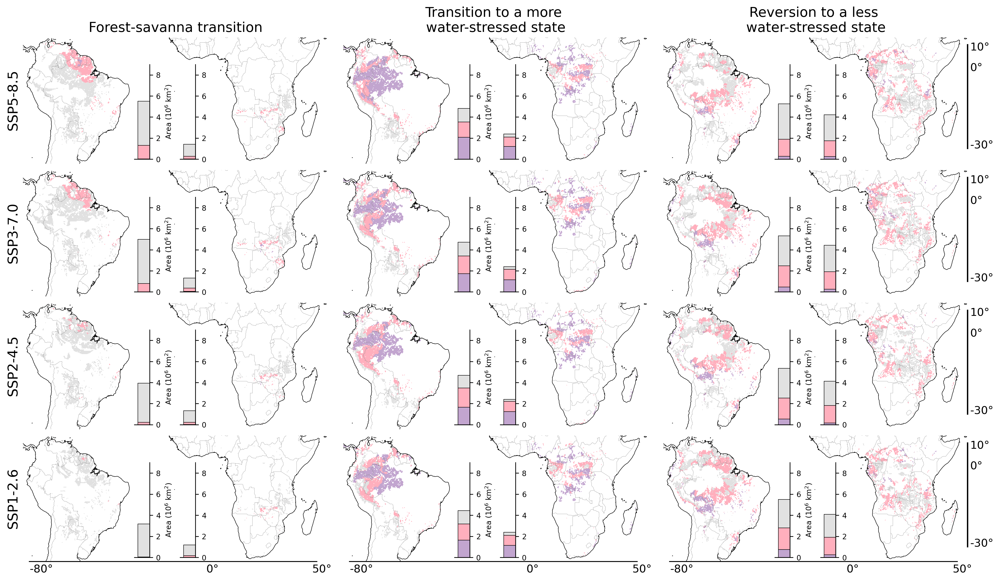

In [59]:
fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

#rectangle_combined_plots()
colors = ['#e1e1e1','#ffafbd','#c2a5cf']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 15, color = 'black', zorder = 1000, rotation  = 90);
    #ax[i].text(-87.5, -28, SSP_name, zorder = 10000)
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    i = i+2+1 

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)

ax[0].set_title('Forest-savanna transition', fontsize = '15', color = 'black');
ax[1].set_title('Transition to a more \nwater-stressed state', fontsize = '15', color = 'black');
ax[2].set_title('Reversion to a less \nwater-stressed state', fontsize = '15', color = 'black');

fig.savefig(parent_dir+'/Figures/Supplementary_Fig6_Transition_all_unsorted.tif', dpi=500, bbox_inches="tight")

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


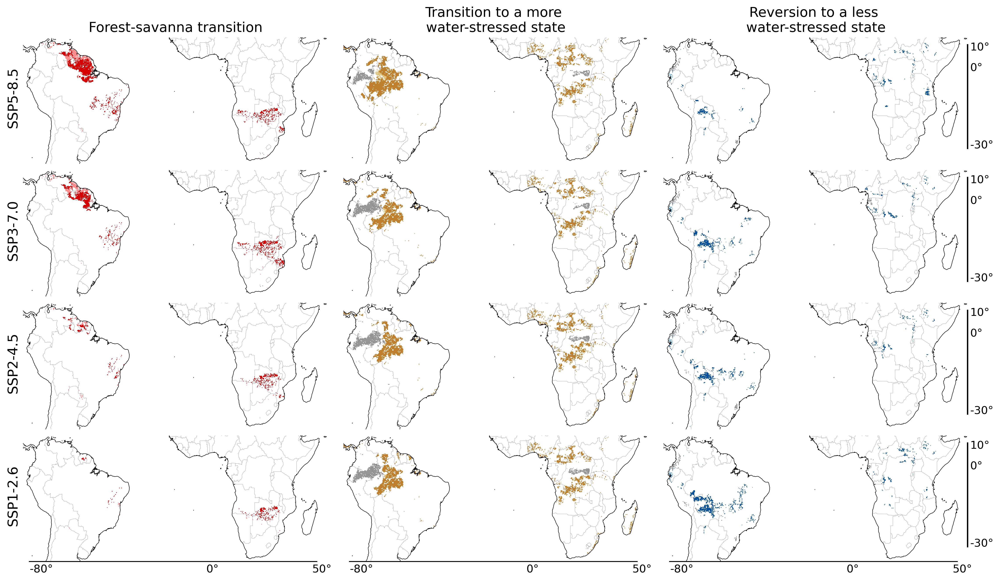

In [60]:
fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

#rectangle_combined_plots()
colors_tp = ['#FFFFFF','#969696','#FF8B8B','#D60000']
colors_ws = ['#FFFFFF','#969696','#DFC27D','#BF812D']
colors_wr = ['#FFFFFF','#969696','#6BAED6','#08519C']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -21, SSP_name, ha='center', fontsize = 15, color = 'black', zorder = 1000, rotation  = 90);
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[1]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,12)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[2]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,13)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[3]],ax = ax[i+0])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[1]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,3)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[2]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,6)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[3]],ax = ax[i+1])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[1]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,7)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[2]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,8)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[3]],ax = ax[i+2])
    
    i = i+2+1 

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[1]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,12)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[2]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,13)
    b = b.where(b > 0.2)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[3]],ax = ax[i+0])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[1]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,3)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[2]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,6)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[3]],ax = ax[i+1])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[1]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,7)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[2]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,8)
    b = b.where(b > 0.5)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[3]],ax = ax[i+2])
    
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)

ax[0].set_title('Forest-savanna transition', fontsize = '15', color = 'black');
ax[1].set_title('Transition to a more \nwater-stressed state', fontsize = '15', color = 'black');
ax[2].set_title('Reversion to a less \nwater-stressed state', fontsize = '15', color = 'black');

fig.savefig(parent_dir+'/Figures/Fig3_Transition_all.tif', dpi=500, bbox_inches="tight")
#fig.savefig(parent_dir+'/Figures/Fig3_Transition_all.svg', dpi=10, bbox_inches="tight")

In [79]:
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print('Sensitivity-Normal ('+SSP+')');
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11)
    b_1 = b.where(b > 0.2).values
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,12)
    b_2 = b.where(b > 0.2).values
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,13)
    b_3 = b.where(b > 0.2).values
    b = np.nansum([b_1,b_2,b_3], axis = 0)
    b = b/b
    Sr_contour.where(b > 0).to_netcdf(parent_dir+'Dataexport_validation/SA_'+str(SSP)+'_tipping.nc')
    
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print('Sensitivity-Normal ('+SSP+')');
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2)
    b_1 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,3)
    b_2 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,6)
    b_3 = b.where(b > 0.5).values
    b = np.nansum([b_1,b_2,b_3], axis = 0)
    b = b/b
    Sr_contour.where(b > 0).to_netcdf(parent_dir+'Dataexport_validation/SA_'+str(SSP)+'_willstress.nc')
    
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print('Sensitivity-Normal ('+SSP+')');
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4)
    b_1 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,7)
    b_2 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,8)
    b_3 = b.where(b > 0.5).values
    b = np.nansum([b_1,b_2,b_3], axis = 0)
    b = b/b
    Sr_contour.where(b > 0).to_netcdf(parent_dir+'Dataexport_validation/SA_'+str(SSP)+'_willrecover.nc')

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)
Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)
Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


In [ ]:
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print('Sensitivity-Normal ('+SSP+')');
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11)
    b_1 = b.where(b > 0.2).values
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,12)
    b_2 = b.where(b > 0.2).values
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,13)
    b_3 = b.where(b > 0.2).values
    b = np.nansum([b_1,b_2,b_3], axis = 0)
    b = b/b
    Sr_contour_AF.where(b > 0).to_netcdf(parent_dir+'Dataexport_validation/AF_'+str(SSP)+'_tipping.nc')
    
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print('Sensitivity-Normal ('+SSP+')');
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2)
    b_1 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,3)
    b_2 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,6)
    b_3 = b.where(b > 0.5).values
    b = np.nansum([b_1,b_2,b_3], axis = 0)
    b = b/b
    Sr_contour_AF.where(b > 0).to_netcdf(parent_dir+'Dataexport_validation/AF_'+str(SSP)+'_willstress.nc')
    
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    print('Sensitivity-Normal ('+SSP+')');
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4)
    b_1 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,7)
    b_2 = b.where(b > 0.5).values
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,8)
    b_3 = b.where(b > 0.5).values
    b = np.nansum([b_1,b_2,b_3], axis = 0)
    b = b/b
    Sr_contour_AF.where(b > 0).to_netcdf(parent_dir+'Dataexport_validation/AF_'+str(SSP)+'_willrecover.nc')

Sensitivity-Normal (ssp585)


In [225]:
i = 8
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
    b = b.where(b > 0.5).values
    #print('SA', calc_area_individually(b,lat_min, lat_max, lon_min, lon_max))
    print('SA',SSP, calc_area_individually(b,lat_min, lat_max, lon_min, lon_max).round(2))
    b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
    b = b.where(b > 0.5).values
    #print(SSP,calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))
    print('AF',SSP, calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))
    print('      ')
    

SA ssp585 0.15
AF ssp585 0.17
      
SA ssp370 0.35
AF ssp370 0.15
      
SA ssp245 0.36
AF ssp245 0.12
      
SA ssp126 0.57
AF ssp126 0.18
      


In [170]:
a_SA = calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max)
a_AF = calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
#print(a_SA)
#print(a_AF)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    AF = 0
    for i in [4,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print(SSP, ' SA-', SA, round(SA/a_SA*100, 4))
    #print(SSP, ' AF-', AF, round(AF/a_AF*100, 4))
    

ssp585  SA- 0.22626180251255726 2.8002
ssp370  SA- 0.4186261035798868 5.1809
ssp245  SA- 0.4504714748848564 5.575
ssp126  SA- 0.6744088753021764 8.3465


In [53]:
## Checking model agreement % forest for result
a_SA = calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max)
a_AF = calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
print(a_SA)
print(a_AF)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    AF = 0
    
    for i in [2,3,6,4,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    
    for i in [11,12,13]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    """
    """
    print(SSP, ' SA-', SA, round(SA/a_SA*100, 2))
    #print(SSP, ' AF-', AF, round(AF/a_AF*100, 2))
    

8.080151171837588
5.520188463180987
ssp585  SA- 3.4379024842287933 42.55
ssp370  SA- 2.931860950786912 36.28
ssp245  SA- 2.3111547947112254 28.6
ssp126  SA- 2.3316601220748026 28.86


In [49]:
(0.18+0.01)/5.52

0.034420289855072464

In [62]:
## Checking model agreement % forest for result
a_SA = calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max)
a_AF = calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
print(a_SA)
print(a_AF)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    AF = 0
    for i in [2,3,4,6,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    for i in [11,12,13]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print(SSP, ' SA-', SA, round(SA/a_SA*100, 2))
    print(SSP, ' AF-', AF, round(AF/a_AF*100, 2))
    

8.080151171837588
5.520188463180987
ssp585  SA- 2.145937545088484 26.56
ssp585  AF- 1.3548159997007274 24.54
ssp370  SA- 2.124107399371344 26.29
ssp370  AF- 1.3065390818157196 23.67
ssp245  SA- 2.082157762623459 25.77
ssp245  AF- 1.3695300479112014 24.81
ssp126  SA- 2.29218801424854 28.37
ssp126  AF- 1.3257774393195214 24.02


In [63]:
## Checking model agreement % forest for result
a_SA = calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max)
a_AF = calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
print(a_SA)
print(a_AF)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    AF = 0
    for i in [2,3,4,6,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    for i in [11,12,13]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        AF = AF+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print(SSP, ' SA-', SA, round(SA/a_SA*100, 2))
    print(SSP, ' AF-', AF, round(AF/a_AF*100, 2))
    

8.080151171837588
5.520188463180987
ssp585  SA- 7.192542278963694 89.01
ssp585  AF- 4.199801202846764 76.08
ssp370  SA- 6.986935071252802 86.47
ssp370  AF- 4.515676727272944 81.8
ssp245  SA- 6.570003725692241 81.31
ssp245  AF- 4.354727812999459 78.89
ssp126  SA- 6.094784942436213 75.43
ssp126  AF- 4.213419393079956 76.33


In [63]:
def transition_overlap_tipping02(model_agreement, baseline, other_transitions, CMIP6_class_dictionary, lat_min, lat_max, lon_min, lon_max):
    model = model_agreement
    baseline = baseline
    other_transitions = other_transitions
    overlap = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
        a_1 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[0])
        a_1 = a_1.where(a_1 > 0.2).values
        a_1 = a_1/a_1
        a_2 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[1])
        a_2 = a_2.where(a_2 > 0.2).values
        a_2 = a_2/a_2
        a_3 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[2])
        a_3 = a_3.where(a_3 > 0.2).values
        a_3 = a_3/a_3
        b = np.nansum([a_1,a_2,a_3], axis = 0)
        #print('Check', np.unique(b))

        o_1 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[0])
        o_1 = o_1.where(o_1 > model).values
        o_1 = o_1/o_1
        o_2 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[1])
        o_2 = o_2.where(o_2 > model).values
        o_2 = o_2/o_2
        o_3 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[2])
        o_3 = o_3.where(o_3 > model).values
        o_3 = o_3/o_3
        o_4 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[3])
        o_4 = o_4.where(o_4 > model).values
        o_4 = o_4/o_4
        o_5 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[4])
        o_5 = o_5.where(o_5 > model).values
        o_5 = o_5/o_5
        o_6 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[5])
        o_6 = o_6.where(o_6 > model).values
        o_6 = o_6/o_6
        b_o = np.nansum([o_1,o_2,o_3, o_4, o_5, o_6], axis = 0)
        #print(np.nansum(b_o))

        #print('Check_other', np.unique(b_o))
        b_o_final = np.nansum([b, b_o/b_o], axis = 0)
        #print('Check_final', np.unique(b_o_final))
        #print('Final area', (calc_area_individually(np.where(b_o_final>1,b_o_final,np.nan),lat_min, lat_max, lon_min, lon_max).round(5)))
        overlap.append(calc_area_individually(np.where(b_o_final>1,b_o_final,np.nan),lat_min, lat_max, lon_min, lon_max).round(5))
    return overlap

In [64]:
model_agreement = 0.5
baseline = [11,12,13]
other_transitions = [2,3,6, 4,7,8]
print(transition_overlap_tipping02(model_agreement, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                             lat_min, lat_max, lon_min, lon_max))
print(transition_overlap_tipping02(model_agreement, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))

[0.02069, 0.02592, 0.00152, 0.0]
[0.00065, 0.00135, 0.0, 0.0]


In [125]:
model_agreement = 0.5
baseline = [2,3,6,]
other_transitions = [11,12,13, 4,7,8]
print(transition_overlap_tipping02(model_agreement, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                             lat_min, lat_max, lon_min, lon_max))
print(transition_overlap_tipping02(model_agreement, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))

[0.02069, 0.02592, 0.00152, 0.0]
[0.00065, 0.00135, 0.0, 0.0]


In [126]:
model_agreement = 0.5
baseline = [4,7,8]
other_transitions = [2,3,6,11,12,13]
print(transition_overlap_tipping02(model_agreement, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                             lat_min, lat_max, lon_min, lon_max))
print(transition_overlap_tipping02(model_agreement, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))

[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]


Tipping 16.34160766387389
HWSF 23.406420575188434
Recovery 8.346644496314065
SA_Recovery [0.0, 0.0, 0.0, 0.0]
-----
Tipping 6.618353867350131
HWSF 22.236036921698574
Recovery 3.4764991744136755
Check these values to set the ylim


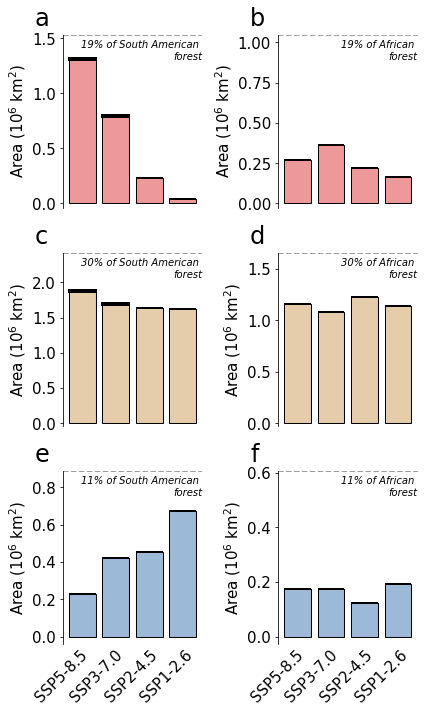

In [67]:
fig, ax = plt.subplots(3,2, figsize=(6,10))
from matplotlib.ticker import ScalarFormatter
class ScalarFormatterForceFormat(ScalarFormatter):
    def _set_format(self):  # Override function that finds format to use.
        self.format = "%1.1f"  # Give format here

colors_tp = '#D60000'
colors_ws = '#BF812D'
colors_wr = '#08519C'
hatch = None

a_axis = []
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [11,12,13]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
a_axis.append(a_ind.max())
print('Tipping',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
overlap = [0.02069, 0.02592, 0.00152, 0.0]
for i in range(4):
    ax[0][0].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
    ax[0][0].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
    ax[0][0].bar(i, overlap[i], width = 0.8, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [2,3,6]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
a_axis.append(a_ind.max())
print('HWSF',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
overlap = [0.02069, 0.02592, 0.00152, 0.0]
for i in range(4):
    ax[1][0].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
    ax[1][0].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
    ax[1][0].bar(i, overlap[i], width = 0.8, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [4,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
a_axis.append(a_ind.max())
print('Recovery',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
overlap = [0.0, 0.0, 0.0, 0.0]
print('SA_Recovery', overlap)
for i in range(4):
        ax[2][0].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][0].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][0].bar(i, overlap[i], width = 0.8, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

#---------------------------------
print('-----')
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))

a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [11,12,13]:
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.2).values
        SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
a_axis.append(a_ind.max())
print('Tipping',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
overlap = [0.00065, 0.00135, 0.0, 0.0]
for i in range(4):
    ax[0][1].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
    ax[0][1].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
    ax[0][1].bar(i, overlap[i], width = 0.8, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [2,3,6]:
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
a_axis.append(a_ind.max())
print('HWSF',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
overlap = [0.00065, 0.00135, 0.0, 0.0]
for i in range(4):
    ax[1][1].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
    ax[1][1].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
    ax[1][1].bar(i, overlap[i], width = 0.8, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
a_ind = []
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    SA = 0
    for i in [4,7,8]:
        b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
        b = b.where(b > 0.5).values
        SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    a_ind.append(SA)
a_ind = np.array(a_ind)
a_axis.append(a_ind.max())
print('Recovery',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
overlap = [0.0, 0.0, 0.0, 0.0]
for i in range(4):
    ax[2][1].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
    ax[2][1].bar(i, a_ind[i], width=0.8, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
    ax[2][1].bar(i, overlap[i], width = 0.8, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
#----------------------------------------
for j in range(2):
    for i in range(3):
        ax[i][j].spines['right'].set_visible(False)
        ax[i][j].spines['top'].set_visible(False)
        ax[i][j].set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 15)
        ax[i][j].spines['bottom'].set_visible(False)
        ax[i][j].tick_params(
                    axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
        ax[i][j].tick_params(axis='both', which='major', labelsize=15)
    
#---- South America axes
Tipping_perc = 19
HWSF_perc = 30
Recovery_perc = 11
        
ax[0][0].set_ylim(-SA_area*0.5/100,SA_area*Tipping_perc/100)
ax[0][0].axhline(SA_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][0].annotate(str(Tipping_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][0].set_ylim(-SA_area*0.5/100,SA_area*HWSF_perc/100)
ax[1][0].axhline(SA_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][0].annotate(str(HWSF_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][0].set_ylim(-SA_area*0.5/100,SA_area*Recovery_perc/100)
ax[2][0].axhline(SA_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][0].annotate(str(Recovery_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
#---- Africa axes
ax[0][1].set_ylim(-AF_area*0.5/100,AF_area*Tipping_perc/100)
ax[0][1].axhline(AF_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][1].annotate(str(Tipping_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][1].set_ylim(-AF_area*0.5/100,AF_area*HWSF_perc/100)
ax[1][1].axhline(AF_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][1].annotate(str(HWSF_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][1].set_ylim(-AF_area*0.5/100,AF_area*Recovery_perc/100)
ax[2][1].axhline(AF_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][1].annotate(str(Recovery_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)

print('Check these values to set the ylim')
for SSP_name,x in zip(['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6'],[0.20,0.45,0.7,0.95]):
    ax[2][0].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)
    ax[2][1].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.5, hspace=0.15)

import string
axs = ax.flat
for n, ax in enumerate(axs):
    ax.text(-0.20, 1.05, string.ascii_lowercase[n], transform=ax.transAxes, 
            size=24)
plt.tight_layout()

fig.savefig(parent_dir+'/Figures/Supplementary_Fig8_Barplot_SSP.tiff', dpi=300, bbox_inches="tight")

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


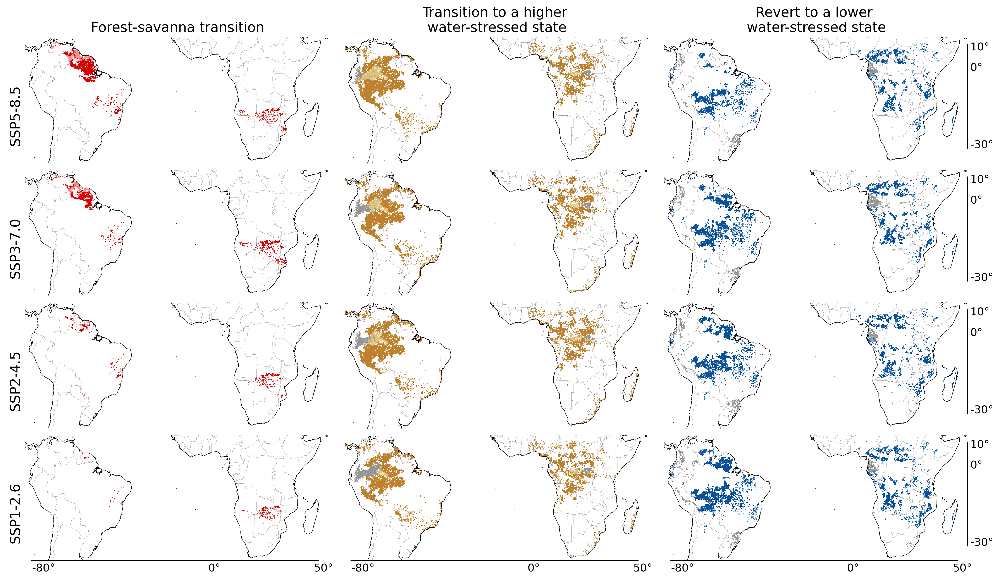

In [118]:
fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

rectangle_combined_plots()
colors_tp = ['#FFFFFF','#969696','#FF8B8B','#D60000']
colors_ws = ['#FFFFFF','#969696','#DFC27D','#BF812D']
colors_wr = ['#FFFFFF','#969696','#6BAED6','#08519C']
model = 0.2
i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -28, SSP_name, ha='center', fontsize = 15, color = 'black', zorder = 1000, rotation  = 90);
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[1]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,12)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[2]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,13)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[3]],ax = ax[i+0])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[1]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,3)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[2]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,6)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[3]],ax = ax[i+1])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[1]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,7)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[2]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,8)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[3]],ax = ax[i+2])
    
    i = i+2+1 

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[1]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,12)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[2]],ax = ax[i+0])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,13)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_tp[0],colors_tp[3]],ax = ax[i+0])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[1]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,3)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[2]],ax = ax[i+1])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,6)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_ws[0],colors_ws[3]],ax = ax[i+1])
    
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[1]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,7)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[2]],ax = ax[i+2])
    b = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,8)
    b = b.where(b > model)
    b.plot(vmin = 0, vmax = 1, levels = [0,0.2,1], add_colorbar=False, colors = [colors_wr[0],colors_wr[3]],ax = ax[i+2])
    
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)

ax[0].set_title('Forest-savanna transition', fontsize = '15', color = 'black');
ax[1].set_title('Transition to a higher \nwater-stressed state', fontsize = '15', color = 'black');
ax[2].set_title('Revert to a lower \nwater-stressed state', fontsize = '15', color = 'black');

#fig.savefig(parent_dir+'/Figures/Fig3_Transition_all.tif', dpi=500, bbox_inches="tight")
#fig.savefig(parent_dir+'/Figures/Fig3_Transition_all.svg', dpi=10, bbox_inches="tight")

In [68]:
def transition_overlap(model_agreement, baseline, other_transitions, CMIP6_class_dictionary, lat_min, lat_max, lon_min, lon_max):
    model = model_agreement
    baseline = baseline
    other_transitions = other_transitions
    overlap = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
        a_1 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[0])
        a_1 = a_1.where(a_1 > model).values
        a_1 = a_1/a_1
        a_2 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[1])
        a_2 = a_2.where(a_2 > model).values
        a_2 = a_2/a_2
        a_3 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[2])
        a_3 = a_3.where(a_3 > model).values
        a_3 = a_3/a_3
        b = np.nansum([a_1,a_2,a_3], axis = 0)
        #print('Check', np.unique(b))

        o_1 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[0])
        o_1 = o_1.where(o_1 > model).values
        o_1 = o_1/o_1
        o_2 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[1])
        o_2 = o_2.where(o_2 > model).values
        o_2 = o_2/o_2
        o_3 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[2])
        o_3 = o_3.where(o_3 > model).values
        o_3 = o_3/o_3
        o_4 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[3])
        o_4 = o_4.where(o_4 > model).values
        o_4 = o_4/o_4
        o_5 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[4])
        o_5 = o_5.where(o_5 > model).values
        o_5 = o_5/o_5
        o_6 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[5])
        o_6 = o_6.where(o_6 > model).values
        o_6 = o_6/o_6
        b_o = np.nansum([o_1,o_2,o_3, o_4, o_5, o_6], axis = 0)
        #print('Check_other', np.unique(b_o))
        b_o_final = np.nansum([b, b_o/b_o], axis = 0)
        #print('Check_final', np.unique(b_o_final))
        #print('Final area', (calc_area_individually(np.where(b_o_final>1,b_o_final,np.nan),lat_min, lat_max, lon_min, lon_max).round(5)))
        overlap.append(calc_area_individually(np.where(b_o_final>1,b_o_final,np.nan),lat_min, lat_max, lon_min, lon_max).round(5))
    return overlap

In [207]:
def transition_overlap_v2_spatial_check(model_agreement, transitions, CMIP6_class_dictionary, lat_min, lat_max, lon_min, lon_max):
    global b_o
    model = model_agreement
    transitions = transitions
    overlap = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
        o_1 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[0])
        o_1 = o_1.where(o_1 > model).values
        o_1 = o_1/o_1
        o_2 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[1])
        o_2 = o_2.where(o_2 > model).values
        o_2 = o_2/o_2
        o_3 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[2])
        o_3 = o_3.where(o_3 > model).values
        o_3 = o_3/o_3
        a_1 = np.nansum([o_1,o_2,o_3], axis = 0)
        a_1 = a_1/a_1
        o_4 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[3])
        o_4 = o_4.where(o_4 > model).values
        o_4 = o_4/o_4
        o_5 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[4])
        o_5 = o_5.where(o_5 > model).values
        o_5 = o_5/o_5
        o_6 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[5])
        o_6 = o_6.where(o_6 > model).values
        o_6 = o_6/o_6
        a_2 = np.nansum([o_4,o_5,o_6], axis = 0)
        a_2 = a_2/a_2
        o_7 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[6])
        o_7 = o_7.where(o_7 > model).values
        o_7 = o_7/o_7
        o_8 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[7])
        o_8 = o_8.where(o_8 > model).values
        o_8 = o_8/o_8
        o_9 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,transitions[8])
        o_9 = o_9.where(o_9 > model).values
        o_9 = o_9/o_9
        a_3 = np.nansum([o_7,o_8,o_9], axis = 0)
        a_3 = a_3/a_3
        
        #b_o = np.nansum([a_1,a_2,a_3], axis = 0)
        b_o = np.nansum([o_1,o_2,o_3, o_4, o_5, o_6, o_7, o_8, o_9], axis = 0)
        #print('Check_other', np.unique(b_o))
        #b_o_final = np.nansum([b, b_o/b_o], axis = 0)
        #print('Check_final', np.unique(b_o_final))
        #print('Final area', (calc_area_individually(np.where(b_o_final>1,b_o_final,np.nan),lat_min, lat_max, lon_min, lon_max).round(5)))
        overlap.append(calc_area_individually(np.where(b_o>1,b_o,np.nan),lat_min, lat_max, lon_min, lon_max).round(5))
    return overlap

In [210]:
transitions = [11,12,13, 2,3,6, 4,7,8]
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max))
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max))

print(transition_overlap_v2_spatial_check(0.2, transitions, SA_CMIP6_class_all_forest_savanna_corrected, lat_min, lat_max, lon_min, lon_max)/SA_area*100)
print(transition_overlap_v2_spatial_check(0.2, transitions, AF_CMIP6_class_all_forest_savanna_corrected, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)/AF_area*100)

[11.19793406 11.03494206  6.6451727   2.62655977]
[4.039536   5.50832643 4.99131509 4.0007692 ]


In [104]:
print(SA_area)
print(AF_area)

8.08
5.52


[1.3204019  0.80775355 0.22899703 0.03947211]
Tipping 16.34160766387389
SA_Tipping [0.40285, 0.52545, 0.16118, 0.02361]
HWSF 49.41622108348939
SA_Stress [0.70892, 0.55675, 0.41383, 0.16343]
Recovery 34.21533592879173
SA_Recovery [0.20311, 0.34618, 0.13699, 0.07504]
[0.02843696 0.         0.         0.        ]
Tipping 0.35194257550372526
SA_Tipping [0.0, 0.0, 0.0, 0.0]
HWSF 23.406420575188434
SA_Stress [0.0, 0.0, 0.0, 0.0]
Recovery 8.346644496314065
SA_Recovery [0.0, 0.0, 0.0, 0.0]
-----
Tipping 6.618353867350131
AF_Tipping [0.03812, 0.06878, 0.05912, 0.06922]
HWSF 41.95510590610853
AF_Stress [0.16585, 0.2307, 0.20047, 0.14596]
Recovery 34.73042774321935
AF_Recovery [0.13706, 0.2176, 0.15949, 0.14475]
Tipping 0.92033957940719
AF_Tipping [0.0, 0.0, 0.0, 0.0]
HWSF 22.236036921698574
AF_Stress [0.0, 0.0, 0.0, 0.0]
Recovery 3.4764991744136755
AF_Recovery [0.0, 0.0, 0.0, 0.0]
Check these values to set the ylim


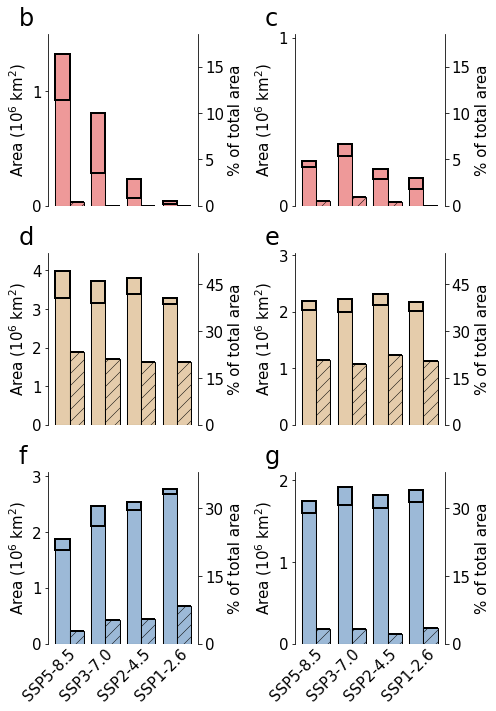

In [106]:
def second_axis(axis1, axis2, ax2_ylim, gap = 5):
    global ax2
    ax2 = ax[axis1][axis2].twinx()
    ax2.set_ylim(0,ax2_ylim)
    ax2.set_yticks(np.arange(0, ax2_ylim, gap))
    ax2.spines['left'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.set_ylabel(r'% of total area',fontsize = 15)
    ax2.spines['bottom'].set_visible(False)
    ax2.tick_params(
                        axis='x',          # changes apply to the x-axis
                        which='both',      # both major and minor ticks are affected
                        bottom=False,      # ticks along the bottom edge are off
                        top=False,         # ticks along the top edge are off
                        labelbottom=False)
    ax2.tick_params(axis='both', which='major', labelsize=15)
    
#---- South America axes
Tipping_perc = 18.5
HWSF_perc = 55
Recovery_perc = 38

fig, ax = plt.subplots(3,2, figsize=(7,10))
from matplotlib.ticker import ScalarFormatter
class ScalarFormatterForceFormat(ScalarFormatter):
    def _set_format(self):  # Override function that finds format to use.
        self.format = "%1.1f"  # Give format here

colors_tp = '#D60000'
colors_ws = '#BF812D'
colors_wr = '#08519C'

a_axis = []
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))
#a = []

for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    print(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Tipping', overlap)
    for i in range(4):
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
        if (model == 0.2) & (i == 0):
            second_axis(0,0,Tipping_perc)
            
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Stress',overlap)
    for i in range(4):
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
        if (model == 0.2) & (i == 0):
            second_axis(1,0,HWSF_perc,15)
            
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Recovery', overlap)
    for i in range(4):
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
        if (model == 0.2) & (i == 0):
            second_axis(2,0,Recovery_perc,15)
#---------------------------------
print('-----')
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))
for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Tipping', overlap)
    for i in range(4):
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
        if (model == 0.2) & (i == 0):
            second_axis(0,1,Tipping_perc)
            
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Stress', overlap)
    for i in range(4):
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
        if (model == 0.2) & (i == 0):
            second_axis(1,1,HWSF_perc,15)
            
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Recovery', overlap)
    for i in range(4):
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
        if (model == 0.2) & (i == 0):
            second_axis(2,1,Recovery_perc,15)

#----------------------------------------
for j in range(2):
    for i in range(3):
        ax[i][j].spines['right'].set_visible(False)
        ax[i][j].spines['top'].set_visible(False)
        ax[i][j].set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 15)
        ax[i][j].spines['bottom'].set_visible(False)
        ax[i][j].tick_params(
                    axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
        ax[i][j].tick_params(axis='both', which='major', labelsize=15)
    
for j in range(2):
    for i in range(3):
        ax[i][j].set_yticks(np.arange(0, 5, 1))

ax[0][0].set_ylim(0,SA_area*Tipping_perc/100)
#ax[0][0].axhline(SA_area*Tipping_perc/100, ls = '--', color = 'grey')
#ax[0][0].annotate(str(Tipping_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][0].set_ylim(0,SA_area*HWSF_perc/100)
#ax[1][0].axhline(SA_area*HWSF_perc/100, ls = '--', color = 'grey')
#ax[1][0].annotate(str(HWSF_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][0].set_ylim(0,SA_area*Recovery_perc/100)
#ax[2][0].axhline(SA_area*Recovery_perc/100, ls = '--', color = 'grey')
#ax[2][0].annotate(str(Recovery_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
#---- Africa axes
ax[0][1].set_ylim(0,AF_area*Tipping_perc/100)
#ax[0][1].axhline(AF_area*Tipping_perc/100, ls = '--', color = 'grey')
#ax[0][1].annotate(str(Tipping_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][1].set_ylim(0,AF_area*HWSF_perc/100)
#ax[1][1].axhline(AF_area*HWSF_perc/100, ls = '--', color = 'grey')
#ax[1][1].annotate(str(HWSF_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][1].set_ylim(0,AF_area*Recovery_perc/100)
#ax[2][1].axhline(AF_area*Recovery_perc/100, ls = '--', color = 'grey')
#ax[2][1].annotate(str(Recovery_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)


print('Check these values to set the ylim')
for SSP_name,x in zip(['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6'],[0.20,0.45,0.7,0.95]):
    ax[2][0].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)
    ax[2][1].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.5, hspace=0.15)

import string
axs = ax.flat
for n, ax in enumerate(axs):
    ax.text(-0.20, 1.05, string.ascii_lowercase[n+1], transform=ax.transAxes, 
            size=24)
plt.tight_layout()

#fig.savefig(parent_dir+'/Figures/Fig2_Barplot_SSP.svg', dpi=10, bbox_inches="tight")

In [3]:
import numpy as np
np.array([1.3204019/0.80775355,  0.80775355/0.22899703, 0.22899703/0.03947211, 1])

array([1.63465936, 3.52735383, 5.80148946, 1.        ])

Tipping 20.712306424852613
SA_Tipping [0.45542, 0.2186, 0.10122, 0.00308]
HWSF 46.20212929820394
SA_Stress [0.77614, 0.47418, 0.39266, 0.15442]
Recovery 24.945302356570025
SA_Recovery [0.18274, 0.11479, 0.0932, 0.06198]
Tipping 0.009513751720440174
SA_Tipping [0.0, 0.0, 0.0, 0.0]
HWSF 19.631998298379976
SA_Stress [0.0, 0.0, 0.0, 0.0]
Recovery 2.822879500774125
SA_Recovery [0.0, 0.0, 0.0, 0.0]
-----
Tipping 3.023806961058582
AF_Tipping [0.00298, 0.00449, 0.0, 0.0]
HWSF 40.90396772221471
AF_Stress [0.16104, 0.223, 0.19273, 0.14091]
Recovery 26.295573862193145
AF_Recovery [0.10464, 0.15882, 0.10465, 0.07844]
Tipping 0.0
AF_Tipping [0.0, 0.0, 0.0, 0.0]
HWSF 20.411099389799787
AF_Stress [0.0, 0.0, 0.0, 0.0]
Recovery 2.805332630487458
AF_Recovery [0.0, 0.0, 0.0, 0.0]
Check these values to set the ylim


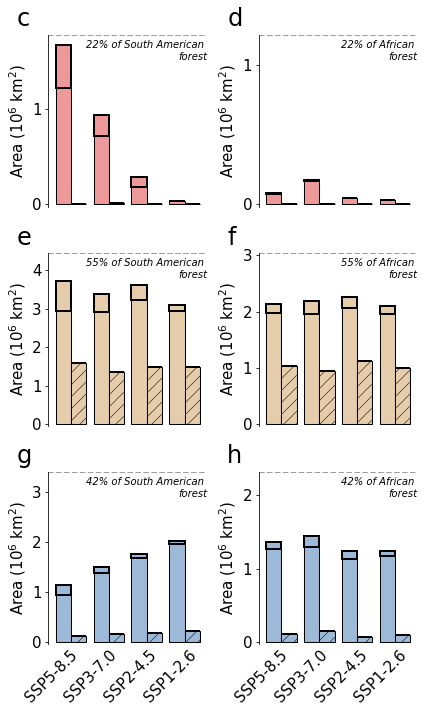

In [174]:
fig, ax = plt.subplots(3,2, figsize=(6,10))
from matplotlib.ticker import ScalarFormatter
class ScalarFormatterForceFormat(ScalarFormatter):
    def _set_format(self):  # Override function that finds format to use.
        self.format = "%1.1f"  # Give format here

colors_tp = '#D60000'
colors_ws = '#BF812D'
colors_wr = '#08519C'

a_axis = []
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))
#a = []

for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Tipping', overlap)
    for i in range(4):
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Stress',overlap)
    for i in range(4):
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected_high_sensitivity, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Recovery', overlap)
    for i in range(4):
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

#---------------------------------
print('-----')
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))
for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Tipping', overlap)
    for i in range(4):
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Stress', overlap)
    for i in range(4):
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected_high_sensitivity, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Recovery', overlap)
    for i in range(4):
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
#----------------------------------------
for j in range(2):
    for i in range(3):
        ax[i][j].spines['right'].set_visible(False)
        ax[i][j].spines['top'].set_visible(False)
        ax[i][j].set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 15)
        ax[i][j].spines['bottom'].set_visible(False)
        ax[i][j].tick_params(
                    axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
        ax[i][j].tick_params(axis='both', which='major', labelsize=15)
    
#---- South America axes
Tipping_perc = 22
HWSF_perc = 55
Recovery_perc = 42
for j in range(2):
    for i in range(3):
        ax[i][j].set_yticks(np.arange(0, 5, 1))
        
ax[0][0].set_ylim(-SA_area*0.5/100,SA_area*Tipping_perc/100)
ax[0][0].axhline(SA_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][0].annotate(str(Tipping_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][0].set_ylim(-SA_area*0.5/100,SA_area*HWSF_perc/100)
ax[1][0].axhline(SA_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][0].annotate(str(HWSF_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][0].set_ylim(-SA_area*0.5/100,SA_area*Recovery_perc/100)
ax[2][0].axhline(SA_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][0].annotate(str(Recovery_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
#---- Africa axes
ax[0][1].set_ylim(-AF_area*0.5/100,AF_area*Tipping_perc/100)
ax[0][1].axhline(AF_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][1].annotate(str(Tipping_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][1].set_ylim(-AF_area*0.5/100,AF_area*HWSF_perc/100)
ax[1][1].axhline(AF_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][1].annotate(str(HWSF_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][1].set_ylim(-AF_area*0.5/100,AF_area*Recovery_perc/100)
ax[2][1].axhline(AF_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][1].annotate(str(Recovery_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)

print('Check these values to set the ylim')
for SSP_name,x in zip(['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6'],[0.20,0.45,0.7,0.95]):
    ax[2][0].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)
    ax[2][1].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.5, hspace=0.15)

import string
axs = ax.flat
for n, ax in enumerate(axs):
    ax.text(-0.20, 1.05, string.ascii_lowercase[n+2], transform=ax.transAxes, 
            size=24)
plt.tight_layout()

fig.savefig(parent_dir+'/Figures/Supplementary_Fig17_Barplot_SSP_High_sensitivity.tif', dpi=300, bbox_inches="tight")

Tipping 11.126780567890414
SA_Tipping [0.32001, 0.36184, 0.07142, 0.00383]
HWSF 50.100466781528
SA_Stress [0.69638, 0.51878, 0.38272, 0.16033]
Recovery 35.797661246387555
SA_Recovery [0.15407, 0.23291, 0.09451, 0.06719]
Tipping 0.02838591105718992
SA_Tipping [0.0, 0.0, 0.0, 0.0]
HWSF 24.338835670595422
SA_Stress [0.0, 0.0, 0.0, 0.0]
Recovery 9.040959378740284
SA_Recovery [0.0, 0.0, 0.0, 0.0]
-----
Tipping 1.4196868667968254
AF_Tipping [0.00861, 0.02397, 0.00424, 0.00074]
HWSF 42.26756369592605
AF_Stress [0.16712, 0.2277, 0.19811, 0.1429]
Recovery 37.565063038580064
AF_Recovery [0.11303, 0.17969, 0.11087, 0.08417]
Tipping 0.0
AF_Tipping [0.0, 0.0, 0.0, 0.0]
HWSF 22.614787441279514
AF_Stress [0.0, 0.0, 0.0, 0.0]
Recovery 3.677445856734636
AF_Recovery [0.0, 0.0, 0.0, 0.0]
Check these values to set the ylim


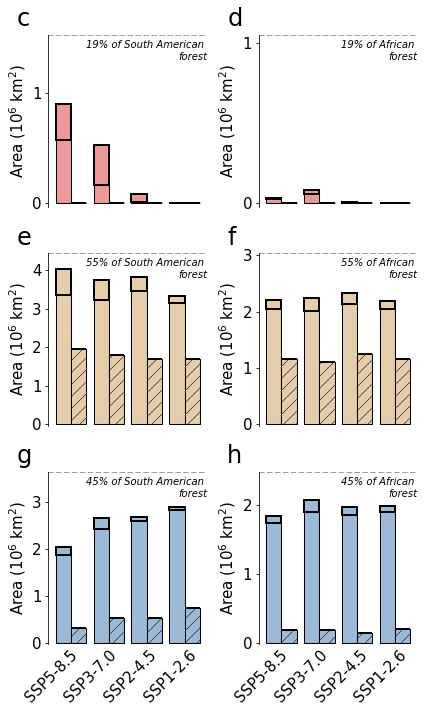

In [175]:
fig, ax = plt.subplots(3,2, figsize=(6,10))
from matplotlib.ticker import ScalarFormatter
class ScalarFormatterForceFormat(ScalarFormatter):
    def _set_format(self):  # Override function that finds format to use.
        self.format = "%1.1f"  # Give format here

colors_tp = '#D60000'
colors_ws = '#BF812D'
colors_wr = '#08519C'

a_axis = []
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))
#a = []

for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Tipping', overlap)
    for i in range(4):
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Stress',overlap)
    for i in range(4):
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected_low_sensitivity, 
                       lat_min, lat_max, lon_min, lon_max)
    print('SA_Recovery', overlap)
    for i in range(4):
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

#---------------------------------
print('-----')
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))
for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Tipping', overlap)
    for i in range(4):
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Stress', overlap)
    for i in range(4):
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected_low_sensitivity, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    print('AF_Recovery', overlap)
    for i in range(4):
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
#----------------------------------------
for j in range(2):
    for i in range(3):
        ax[i][j].spines['right'].set_visible(False)
        ax[i][j].spines['top'].set_visible(False)
        ax[i][j].set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 15)
        ax[i][j].spines['bottom'].set_visible(False)
        ax[i][j].tick_params(
                    axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
        ax[i][j].tick_params(axis='both', which='major', labelsize=15)
    
#---- South America axes
Tipping_perc = 19
HWSF_perc = 55
Recovery_perc = 45
for j in range(2):
    for i in range(3):
        ax[i][j].set_yticks(np.arange(0, 5, 1))
        
ax[0][0].set_ylim(-SA_area*0.5/100,SA_area*Tipping_perc/100)
ax[0][0].axhline(SA_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][0].annotate(str(Tipping_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][0].set_ylim(-SA_area*0.5/100,SA_area*HWSF_perc/100)
ax[1][0].axhline(SA_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][0].annotate(str(HWSF_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][0].set_ylim(-SA_area*0.5/100,SA_area*Recovery_perc/100)
ax[2][0].axhline(SA_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][0].annotate(str(Recovery_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
#---- Africa axes
ax[0][1].set_ylim(-AF_area*0.5/100,AF_area*Tipping_perc/100)
ax[0][1].axhline(AF_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][1].annotate(str(Tipping_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][1].set_ylim(-AF_area*0.5/100,AF_area*HWSF_perc/100)
ax[1][1].axhline(AF_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][1].annotate(str(HWSF_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][1].set_ylim(-AF_area*0.5/100,AF_area*Recovery_perc/100)
ax[2][1].axhline(AF_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][1].annotate(str(Recovery_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)

print('Check these values to set the ylim')
for SSP_name,x in zip(['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6'],[0.20,0.45,0.7,0.95]):
    ax[2][0].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)
    ax[2][1].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.5, hspace=0.15)

import string
axs = ax.flat
for n, ax in enumerate(axs):
    ax.text(-0.20, 1.05, string.ascii_lowercase[n+2], transform=ax.transAxes, 
            size=24)
plt.tight_layout()

fig.savefig(parent_dir+'/Figures/Supplementary_Fig16_Barplot_SSP_Low_sensitivity.tif', dpi=300, bbox_inches="tight")

<xarray.DataArray 'Count' ()>
array(2943)
<xarray.DataArray 'Count' ()>
array(1832)
<xarray.DataArray 'Count' ()>
array(2293)
<xarray.DataArray 'Count' ()>
array(1617)
<xarray.DataArray 'Count' ()>
array(749)
<xarray.DataArray 'Count' ()>
array(211)
<xarray.DataArray 'Count' ()>
array(2863)
<xarray.DataArray 'Count' ()>
array(3622)
<xarray.DataArray 'Count' ()>
array(1093)
<xarray.DataArray 'Count' ()>
array(595)
<xarray.DataArray 'Count' ()>
array(1759)
<xarray.DataArray 'Count' ()>
array(523)


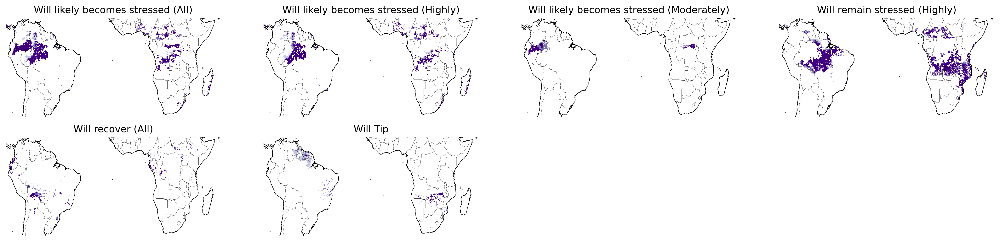

In [61]:
fig = plt.figure(figsize=(22,5), dpi = 300)
ax = [plt.subplot(241,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(242,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(243,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(244,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(245,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(246,projection=ccrs.PlateCarree(), aspect='auto')]

#----- Becomes stressed
b =  np.zeros((Sr_contour.shape[0],Sr_contour.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2,3,6)
    a = a.where(a > 0.5)
    a = (a/a)
    b = np.nansum([a.values,b], axis = 0)
a[:] = 1
b = b*(a/a.values)
b = b.where(b > 0)
b.plot(ax = ax[0], cmap = 'Purples', add_colorbar=False)
print(b.count())
(b.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')

c =  np.zeros((Sr_contour_AF.shape[0],Sr_contour_AF.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2,3,6)
    a = a.where(a > 0.5)
    a = (a/a)
    c = np.nansum([a.values,c], axis = 0)
a[:] = 1
c = c*(a/a.values)
c = c.where(c > 0)
c.plot(ax = ax[0], cmap = 'Purples', add_colorbar=False)
ax[0].set_title('Will likely becomes stressed (All)')
print(c.count())
(c.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')

b = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')
c = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')
d = pd.concat([b,c])
d.to_csv(parent_dir+'/Dataexport_ARCGIS/Become_stressed.csv')
#-----

#----- Becomes stressed (Highly)
b =  np.zeros((Sr_contour.shape[0],Sr_contour.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom_2(SSP, SA_CMIP6_class_all_forest_savanna_corrected,3,6)
    a = a.where(a > 0.5)
    a = (a/a)
    b = np.nansum([a.values,b], axis = 0)
a[:] = 1
b = b*(a/a.values)
b = b.where(b > 0)
b.plot(ax = ax[1], cmap = 'Purples', add_colorbar=False)
print(b.count())
(b.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')

c =  np.zeros((Sr_contour_AF.shape[0],Sr_contour_AF.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom_2(SSP, AF_CMIP6_class_all_forest_savanna_corrected,3,6)
    a = a.where(a > 0.5)
    a = (a/a)
    c = np.nansum([a.values,c], axis = 0)
a[:] = 1
c = c*(a/a.values)
c = c.where(c > 0)
c.plot(ax = ax[1], cmap = 'Purples', add_colorbar=False)
ax[1].set_title('Will likely becomes stressed (Highly)')
print(c.count())
(c.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')

b = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')
c = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')
d = pd.concat([b,c])
d.to_csv(parent_dir+'/Dataexport_ARCGIS/Become_stressed(Highly).csv')
#-----

#----- Becomes stressed (Moderately)
b =  np.zeros((Sr_contour.shape[0],Sr_contour.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2)
    a = a.where(a > 0.5)
    a = (a/a)
    b = np.nansum([a.values,b], axis = 0)
a[:] = 1
b = b*(a/a.values)
b = b.where(b > 0)
b.plot(ax = ax[2], cmap = 'Purples', add_colorbar=False)
print(b.count())
(b.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')

c =  np.zeros((Sr_contour_AF.shape[0],Sr_contour_AF.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2)
    a = a.where(a > 0.5)
    a = (a/a)
    c = np.nansum([a.values,c], axis = 0)
a[:] = 1
c = c*(a/a.values)
c = c.where(c > 0)
c.plot(ax = ax[2], cmap = 'Purples', add_colorbar=False)
ax[2].set_title('Will likely becomes stressed (Moderately)')
print(c.count())
(c.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')

b = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')
c = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')
d = pd.concat([b,c])
d.to_csv(parent_dir+'/Dataexport_ARCGIS/Become_stressed(Moderately).csv')
#-----

#----- Remain stressed (Highly)
b =  np.zeros((Sr_contour.shape[0],Sr_contour.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom_1(SSP, SA_CMIP6_class_all_forest_savanna_corrected,9)
    a = a.where(a > 0.5)
    a = (a/a)
    b = np.nansum([a.values,b], axis = 0)
a[:] = 1
b = b*(a/a.values)
b = b.where(b > 0)
b.plot(ax = ax[3], cmap = 'Purples', add_colorbar=False)
print(b.count())
(b.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')

c =  np.zeros((Sr_contour_AF.shape[0],Sr_contour_AF.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom_1(SSP, AF_CMIP6_class_all_forest_savanna_corrected,9)
    a = a.where(a > 0.5)
    a = (a/a)
    c = np.nansum([a.values,c], axis = 0)
a[:] = 1
c = c*(a/a.values)
c = c.where(c > 0)
c.plot(ax = ax[3], cmap = 'Purples', add_colorbar=False)
ax[3].set_title('Will remain stressed (Highly)')
print(c.count())
(c.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')

b = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')
c = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')
d = pd.concat([b,c])
d.to_csv(parent_dir+'/Dataexport_ARCGIS/Remain_stressed(Highly).csv')
#-----

#----- Will Recover
b =  np.zeros((Sr_contour.shape[0],Sr_contour.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4,7,8)
    a = a.where(a > 0.5)
    a = (a/a)
    b = np.nansum([a.values,b], axis = 0)
a[:] = 1
b = b*(a/a.values)
b = b.where(b > 0)
b.plot(ax = ax[4], cmap = 'Purples', add_colorbar=False)
print(b.count())
(b.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')

c =  np.zeros((Sr_contour_AF.shape[0],Sr_contour_AF.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4,7,8)
    a = a.where(a > 0.5)
    a = (a/a)
    c = np.nansum([a.values,c], axis = 0)
a[:] = 1
c = c*(a/a.values)
c = c.where(c > 0)
c.plot(ax = ax[4], cmap = 'Purples', add_colorbar=False)
ax[4].set_title('Will recover (All)')
print(c.count())
(c.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')

b = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')
c = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')
d = pd.concat([b,c])
d.to_csv(parent_dir+'/Dataexport_ARCGIS/Will_recover.csv')
#-----

#----- Will Tipp
b =  np.zeros((Sr_contour.shape[0],Sr_contour.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11,12,13)
    a = a.where(a > 0.2)
    a = (a/a)
    b = np.nansum([a.values,b], axis = 0)
a[:] = 1
b = b*(a/a.values)
b = b.where(b > 0)
b.plot(ax = ax[5], cmap = 'Purples', add_colorbar=False)
print(b.count())
(b.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')

c =  np.zeros((Sr_contour_AF.shape[0],Sr_contour_AF.shape[1]))
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11,12,13)
    a = a.where(a > 0.2)
    a = (a/a)
    c = np.nansum([a.values,c], axis = 0)
a[:] = 1
c = c*(a/a.values)
c = c.where(c > 0)
c.plot(ax = ax[5], cmap = 'Purples', add_colorbar=False)
ax[5].set_title('Will Tip')
print(c.count())
(c.to_dataframe().dropna()).to_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')

b = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/SA_temp.csv')
c = pd.read_csv(parent_dir+'/Dataexport_ARCGIS/AF_temp.csv')
d = pd.concat([b,c])
d.to_csv(parent_dir+'/Dataexport_ARCGIS/Will_tip.csv')
#-----


for j in range(6):
    ax[j].coastlines(lw = 0.6)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


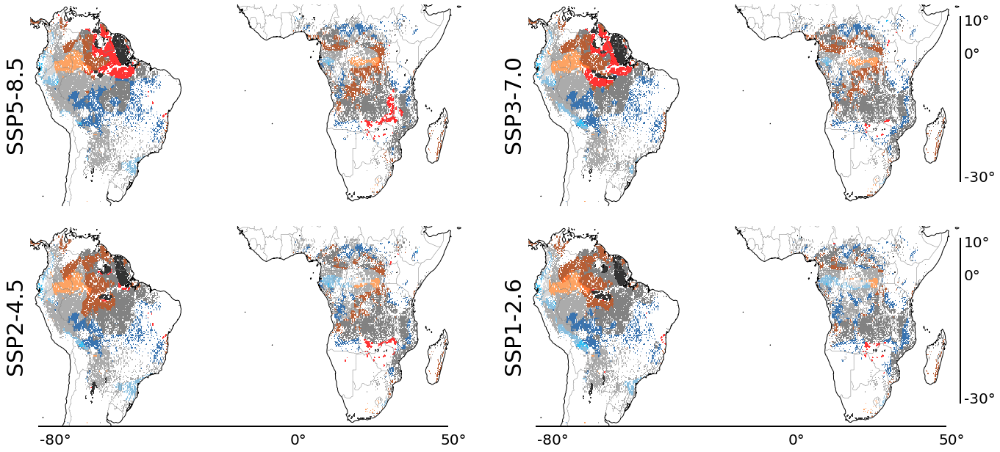

In [157]:
fig = plt.figure(figsize=(22,10))
ax = [plt.subplot(221,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(222,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(223,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(224,projection=ccrs.PlateCarree(), aspect='auto')]

alpha = 0.8
model_name = 'ACCESS-CM2'
i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 30, color = 'black', zorder = 1000, rotation  = 90);
    a = SA_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
    a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
    a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
    a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
    a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    i = i+1

i = 0
for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a = AF_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
    a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
    a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
    a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
    a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    i = i+1
    
for j in range(4):
    ax[j].coastlines(lw = 1)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)
    
for i in [1,3]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '20')
    ax[i].text(56, 8,'10°', fontsize = '20')
    ax[i].text(56, -30,'-30°', fontsize = '20')

for i in [2,3]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 4)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '20')
    ax[i].text(0,-40,'0°', fontsize = '20')
    ax[i].text(48,-40,'50°', fontsize = '20')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.15, hspace=0.1)

#plt.tight_layout()
fig.savefig(parent_dir+'/Figures/Supplementary_Fig7_ACCESS-CM2.tif', dpi=300, bbox_inches="tight")